# Project 1

ΚΟΤΣΑΝΙΤΗΣ ΔΗΜΗΤΡΗΣ ΑΜ: 1115201400254
ΡΑΥΤΟΠΟΥΛΟΣ ΜΙΧΑΗΛ  ΑΜ: 1115201400305

In [1]:
import pandas as pd # Import pandas
import sys # Determine Python version number
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from wordcloud import WordCloud
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from collections import Counter
from nltk.collocations import *
import string
from nltk.tokenize import RegexpTokenizer

Pandas and python version

In [2]:
print('Python version ' + sys.version)
print('Pandas version ' + pd.__version__)

Python version 3.7.6 (default, Jan  8 2020, 13:42:34) 
[Clang 4.0.1 (tags/RELEASE_401/final)]
Pandas version 1.0.1


Create a function to erase non-relevant elements

In [3]:
from pandas import DataFrame
from typing import Set, Any
def remove_others(df: DataFrame, columns: Set[Any]):
    cols_total: Set[Any] = set(df.columns)
    diff: Set[Any] = cols_total - columns
    df.drop(diff, axis=1, inplace=True)

Reading all CSV files

In [4]:
april_listings_df = pd.read_csv("../Desktop/DM/data/april/listings.csv",
                         keep_default_na=False, na_values=[""],low_memory=False)

In [5]:
february_listings_df = pd.read_csv("../Desktop/DM/data/febrouary/listings.csv",
                         keep_default_na=False, na_values=[""],low_memory=False)

In [6]:
march_listings_df = pd.read_csv("../Desktop/DM/data/march/listings.csv",
                         keep_default_na=False, na_values=[""],low_memory=False)

Checking every column of csv files for the ones asked in the assignment

The columns asked:
['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights']

In [7]:
#print (april_listings_df[['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights']])

In [8]:
#print (february_listings_df[['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights']])

In [9]:
#print (march_listings_df[['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights']])

Keep only the ones we need and delete everything else

In [10]:
remove_others(april_listings_df, {'id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights'})

In [11]:
remove_others(february_listings_df, {'id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights'})

In [12]:
remove_others(march_listings_df, {'id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights'})

In [13]:
#april_listings_df

In [14]:
#february_listings_df

In [15]:
#march_listings_df

Create a new column in each month with the unique 'month id' 

In [16]:
# Generate april monthMum == "4" using pandas 
monthNum = 4
for value in april_listings_df["id"]: 
    april_listings_df["MonthNum"] = monthNum 

In [17]:
#print (april_listings_df[['MonthNum']])

In [18]:
# Generate february monthMum == "2" using pandas 
monthNum = 2
for value in february_listings_df["id"]: 
    february_listings_df["MonthNum"] = monthNum 

In [19]:
#print (february_listings_df[['MonthNum']])

In [20]:
# Generate march monthMum == "3" using pandas 
monthNum = 3
for value in march_listings_df["id"]: 
    march_listings_df["MonthNum"] = monthNum 

In [21]:
#print (march_listings_df[['MonthNum']])

Storing the first two months in a temp variable

In [22]:
temp1 = pd.concat([april_listings_df,february_listings_df], axis=0)

Creating the final dataframe with all 3 months

In [23]:
final = pd.concat([temp1,march_listings_df], axis=0)

In [24]:
#final

Reset the indexes to the final dataframe

In [25]:
final = final.reset_index(drop=True)

In [26]:
#final

Replacing all the missing data with NaN to be recognizable by python

In [27]:
final = final.replace(['-','na',' ','N/A'], np.nan)

In [28]:
#final

# Export Dataframe to CSV

In [29]:
# Write DataFrame to CSV
final.to_csv("../Desktop/DM/data/april/train.csv", index=False)


In [30]:
train_df = pd.read_csv("../Desktop/DM/data/april/train.csv",
                         keep_default_na=False, na_values=[""],low_memory=False)

In [31]:
#train_df

1.1​ Ποιός είναι ο πιο συχνός τύπος room_type για τα δεδομένα σας ;

In [32]:
train_df['room_type'].value_counts()

Entire home/apt    24765
Private room        3223
Shared room          134
Name: room_type, dtype: int64

The most frequent room type in our dataframe is Entire home/apt

1.2​ Φτιάξτε γράφημα ή γραφήματα που δείχνουν την πορεία των τιμών για το διάστημα των 3 μηνών.

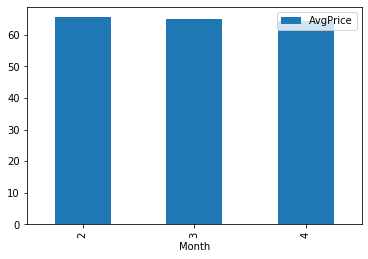

In [33]:
temp3_df = train_df
temp3_df['price'] = temp3_df['price'].replace('[\$,]', '', regex=True).astype(float)

# seperating months
februaryavg_df= temp3_df.loc[temp3_df['MonthNum'] == 2]

marchavg_df= temp3_df.loc[temp3_df['MonthNum'] == 3]

aprilavg_df= temp3_df.loc[temp3_df['MonthNum'] == 4]

# average for each month

febavg = februaryavg_df['price'].mean()

marcavg = marchavg_df['price'].mean()

apavg = aprilavg_df['price'].mean()

# initialize list of lists 
data_avg = [['2', febavg], ['3', marcavg], ['4', apavg]] 
  
# Create the pandas DataFrame 
df = pd.DataFrame(data_avg, columns = ['Month', 'AvgPrice']) 
  
# print dataframe. 
df.plot(x='Month',y='AvgPrice', kind='bar')

1.3​ Ποιές είναι οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές;

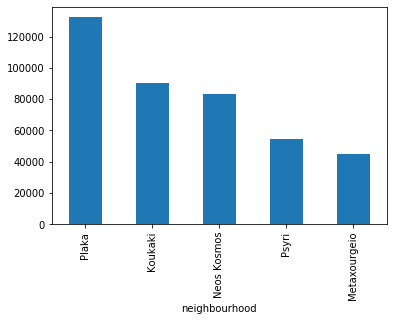

In [34]:
# creating a new sorted dataframe in descending order 
# in which we find the sum of reviews in each neighbourhood
sorted_df = train_df.groupby(['neighbourhood'])['number_of_reviews'].sum().sort_values(ascending=False)
sorted_df.head(5).plot(kind = 'bar')

The first five neighbourhoods ranking in terms of reviews are: Plaka, Koukaki, Neos Kosmos, Psyri, Metaxourgeio

1.4​ Ποιά είναι η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων;

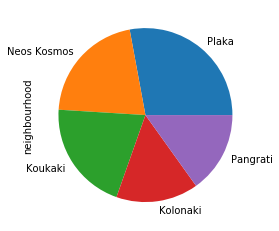

In [35]:
# Create a new df "geit" which contains the number of listings per neighbourhood
# we get the five top neighbourhoods in order to create a chart in a form of a pie
geit=train_df['neighbourhood'].value_counts().head(5).plot(kind='pie')

Plaka is the neighbourhood with the most bookings

1.5​ Πόσες είναι οι καταχωρήσεις ανά γειτονιά και ανά μήνα;

                   feb   mar   apr
Plaka              990  1037  1116
Neos Kosmos        777   791   809
Koukaki            741   771   806
Kolonaki           525   586   611
Pangrati           522   578   602
Psyri              483   485   504
Metaxourgeio       481   521   525
Larissis           472   548   557
Ambelokipi         469   502   511
Exarcheia          382   468   480
Thiseio            314    94   112
Pedion Areos       304   273   268
Neapoli            299   200   207
Mets               296   271   271
Attiki             236   255   267
Petralona          225   230   245
Patisia            218   231   221
Agios Nikolaos     196   206   209
Kypseli            178   309   304
Gazi               165    55    62
Ilisia             154   172   176
Kolonos            129   122   119
Agios Loukas        68    70    71
Votanikos           50    54    59
Monastiraki         36    14    31
Kerameikos          31   370   355
Goudi               27    30    30
Sepolia             

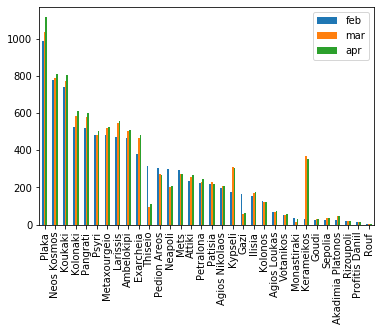

In [36]:
# creating a temp variable and count every booking for each month per neighbourhood
te1_df = februaryavg_df['neighbourhood'].value_counts()
te2_df = marchavg_df['neighbourhood'].value_counts()
te3_df = aprilavg_df['neighbourhood'].value_counts()
# concatenating the temp dfs to create a new one with the needed columns
te4 = pd.concat([te1_df,te2_df], axis=1)
te5 = pd.concat([te4,te3_df], axis=1)
te5.columns = ['feb', 'mar', 'apr'] 
# presenting in both list and chart form
te5.plot( y=["feb", "mar", "apr"], kind="bar")
print(te5)

1.6​ Σχεδιάστε το ιστόγραμμα της μεταβλητής neighborhood

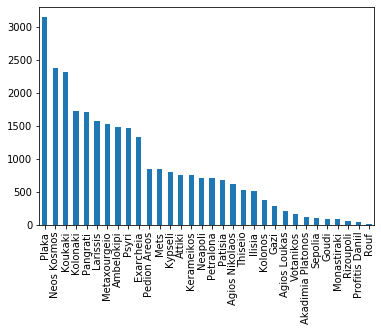

In [37]:
# we use the same temp variable with number of listings for each neighbourhood
geit=train_df['neighbourhood'].value_counts().plot(kind='bar')

1.7​ Ποιος είναι ο πιο συχνός τύπος δωματίου (room_type) σε κάθε γειτονιά (neighborhood);

neighbourhood      room_type      
Plaka              Entire home/apt    2869
Neos Kosmos        Entire home/apt    2177
Koukaki            Entire home/apt    2104
Kolonaki           Entire home/apt    1615
Pangrati           Entire home/apt    1557
                                      ... 
Kolonaki           Shared room           1
Profitis Daniil    Private room          1
Akadimia Platonos  Shared room           1
Monastiraki        Shared room           1
Profitis Daniil    Shared room           1
Name: room_type, Length: 85, dtype: int64


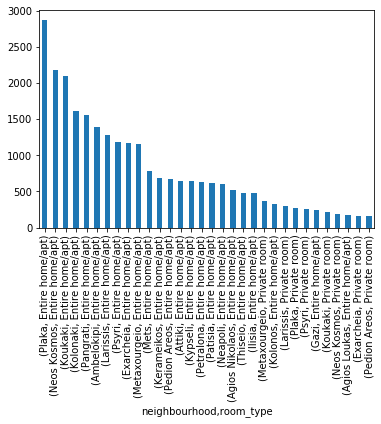

In [38]:
# creating a new sorted dataframe with the number of listings per room type per neighbourhood
sorted2_df = train_df.groupby(['neighbourhood'])['room_type'].value_counts().sort_values(ascending=False)
# presenting in both list and chart form
print(sorted2_df)
sorted2_df.head(32).plot(kind = 'bar')

The most common room type per neighbourhood is depicted above both in list and chart form

1.8​ Ποιός είναι ο πιο ακριβός τύπος δωματίου;

room_type
Entire home/apt    63.067999
Private room       80.300031
Shared room        34.626866
Name: price, dtype: float64


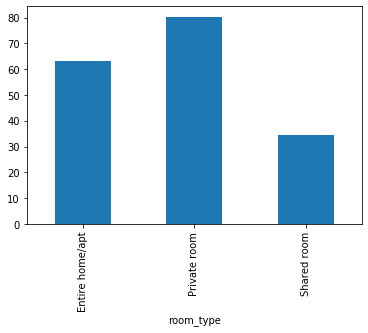

In [39]:
# creating a new temp variable "draft_df" where we find the average type per room type
draft_df = temp3_df.groupby('room_type')['price'].mean()
# presenting in both list and chart form
print(draft_df)
draft_df.plot(kind="bar")

The most pricey room type give the results above is "Private Room"

1.9​ Χρησιμοποιήστε τη βιβλιοθήκη Folium Map με τις στήλες latitude/longitude και εμφανίστε σε ένα χάρτη για ένα μήνα της επιλογής σας τα ακίνητα και στα popup στον χάρτη επιλέξτε όποια άλλη πληροφορία θέλετε να εμφανίζεται για το ακίνητο (πχ bed_type, room_type, transit κτλ) .

In [40]:
# we chose one month and removed all the duplicates
uniqued_df = april_listings_df.drop_duplicates(subset=['id'])
# created a list of the geographic coordinates per listing
locations = uniqued_df[['latitude', 'longitude']]
locationlist = locations.values.tolist()
len(locationlist)
#using the folium function map
map = folium.Map(location=[37.98888, 23.76431], zoom_start=12)
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=uniqued_df['room_type'][point]).add_to(map)
map


1.10​ Φτιάξτε διαφορετικά wordclouds με τα δεδομένα από τη στήλη neighbourhood, transit, description, last_review.

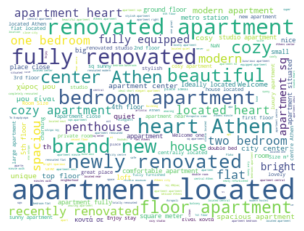

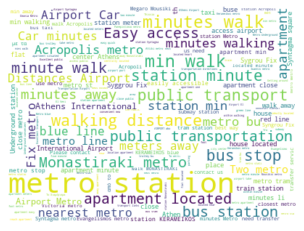

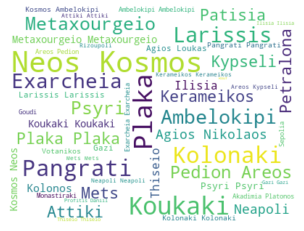

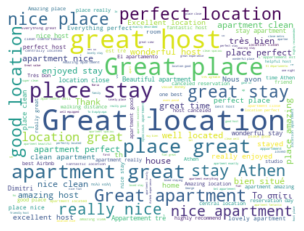

In [41]:
# ## wordcloud "description"
# # creating a temp string variable to keep the column we need
text1 = train_df['description'].to_string()
# using the wordcloud function
wordcloud = WordCloud(width=400,height=300,max_font_size=40, max_words=1000, background_color="white").generate(str(text1))

plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()
# ## wordcloud "transit"
text2 = train_df['transit'].dropna().to_string()

wordcloud2 = WordCloud(width=400,height=300,max_font_size=40, max_words=1000, background_color="white").generate(str(text2))

plt.imshow(wordcloud2,interpolation='bilinear')
plt.axis("off")
plt.show()
# ## wordcloud "neighbourhood"
text3 = train_df['neighbourhood'].dropna().to_string()

wordcloud3 = WordCloud(width=400,height=300,max_font_size=40, max_words=1000, background_color="white").generate(str(text3))

plt.imshow(wordcloud3,interpolation='bilinear')
plt.axis("off")
plt.show()
## wordcloud "last_review"
reviews_df = pd.read_csv("../Desktop/DM/data/march/reviews.csv",
                         keep_default_na=False, na_values=[""],low_memory=False)
reviews_df['comments']
text4 = reviews_df['comments'].dropna().to_string()
wordcloud4 = WordCloud(width=400,height=300,max_font_size=40, max_words=1000, background_color="white").generate(str(text4))

plt.imshow(wordcloud4,interpolation='bilinear')
plt.axis("off")
plt.show()


We created two queries ourselves, which we thought as meaningful given our dataset

1.11​ Ποιά περιοχή έχει τη μεγαλύτερη διαθεσιμότητα all year round?

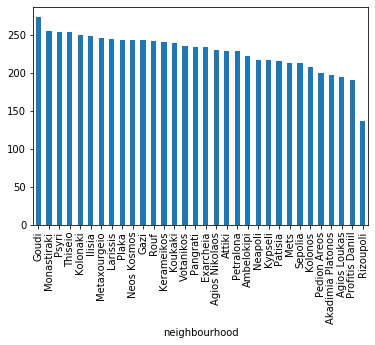

In [42]:
# count the availability per neighbourhood
train_df.groupby('neighbourhood')['availability_365'].mean().sort_values(ascending=False).plot(kind='bar');

The neighbourhood with the higher availability rate is Goudi

1.12 Ποια είναι η σχέση τιμης των δωματίων ανάλογα με τον αριθμό των κρεβατιών?

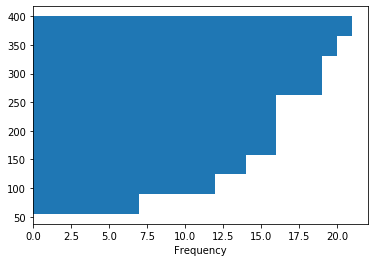

In [43]:
# Calculate the average price for every room depending of the bed number
train_df.groupby('beds')['price'].mean().sort_values(ascending=False).plot.hist(orientation='horizontal', cumulative=True)

# 3

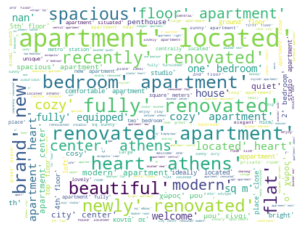

In [44]:
# creating an example_sent containing the description column as string
example_sent = train_df['description'].to_string()
example_sent = example_sent.lower()
# defining the stop words  
stop_words = set(stopwords.words('english')) 
# tokenize the example_sent  
word_tokens = word_tokenize(example_sent) 
# filter for the stopwords defined earlier 
filtered_sentence = [w for w in word_tokens if not w in stop_words] 
  
filtered_sentence = [] 
  
for w in word_tokens: 
    if w not in stop_words: 
# creating the final filtered sentence
        filtered_sentence.append(w) 
  
#print(word_tokens) 
#print(filtered_sentence) 
# worldcloud generating using the function with feed the filtered sentence
wordcloud5 = WordCloud(width=400,height=300,max_font_size=40, max_words=1000, background_color="white").generate(str(filtered_sentence))

plt.imshow(wordcloud5,interpolation='bilinear')
plt.axis("off")
plt.show()

In [45]:
# creating a new temp variable in order to keep one needed column
tempo = train_df['id']
# creating another temp variable to keep the other two
tempo2 = train_df["name"].astype(str) + ' ' + train_df["description"].astype(str)
# combining two temp variables to the final dataframe
tempo3 = pd.concat([tempo,tempo2], axis=1)
# renaming the second column which contains two combined columns
tempo3.rename(columns={0:'namecription'},inplace=True)
# replacing NA with NULL as asked
tempo3['namecription'].fillna("NULL")



0        96m2, 3BR, 2BA, Metro, WI-FI etc... Athens Fur...
1        75m2, 2-br, metro, wi-fi, cable TV Athens Furn...
2        50m2, Metro, WI-FI, cableTV, more Athens Furni...
3        Studio, metro, cable tv, wi-fi, etc The Studio...
4        47m2, close to metro,cable TV,wi-fi AQA No2 is...
                               ...                        
28117    Flat for 3 persons 10 minutes for center of At...
28118    TRADITIONAL VINTAGE ROOM IN ATHENS 2 A unique ...
28119    TRADITIONAL VINTAGE ROOM 3 A unique traditiona...
28120    TRADITIONAL SINGLE ROOM WITH PRIVET BALCONY A ...
28121    ATH Hostel I would be happy to answer any of y...
Name: namecription, Length: 28122, dtype: object

In [49]:
# using the sklearn vectorizer
tf = TfidfVectorizer(analyzer='word', ngram_range=(1, 2),max_df=1.0, min_df=1, stop_words='english')
# creating the TF-IDF matrix  (#3.1)
tfidf_matrix = tf.fit_transform(tempo3['namecription'])
# calculate the consine similarity base on the matrix given above (#3.2)
cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)
results = {}
for idx, row in tempo3.iterrows():
    similar_indices = cosine_similarities[idx].argsort()[:-100:-1]
    similar_items = [(cosine_similarities[idx][i], tempo3['id'][i]) for i in similar_indices]

    # First item is the item itself, so remove it.
    # Each dictionary entry is like: [(1,2), (3,4)], with each tuple being (score, item_id)
    results[row['id']] = similar_items[1:]
print('done!')
#declare list for generateing testing sorce
score_count = []

#to get a friendly item name from the description field, given an item ID
def item(id):
    return tempo3.loc[tempo3['id'] == id]['namecription'].tolist()[0].split(' - ')[0]

# Just reads the results out of the dictionary (#3.3)
def recommend(item_id, num):
    print("Recommending ----->>>>>>> " + str(num) + " products similar to " + item(item_id) + "...")
    recs = results[item_id][:num]
    i=0
    for rec in recs:
        ## print recommendaed items 
        print("Recommended items: " + item(rec[1]) + " (score:" + str(rec[0]) + ")")
#### Start testign logic
        if rec[0] >0.15:
            i+=1
    print ("Recommendation score: "+ str(i))
    score_count.append(str(i))
    return Counter(score_count)
#### End Testing logic
    

done!


In [50]:
## Testing on all items so generate recommendation for all items


    # print the id given in item_id
score_counter_variable = recommend(item_id=10988, num=18)
print("-----------Recommendation for a single item ends here-----------")
print()

Recommending ----->>>>>>> 18 products similar to 75m2, 2-br, metro, wi-fi, cable TV Athens Furnished Apartment No4 is 2-bedroom apartment (75 square meters)  -excellent located  -close to metro station,  -lovely,  -very clean  with all the facilities that you will need, nice balcony, excellent Wi-Fi, cable tv, fully air conditioned… Athens Furnished Apartment No4 is an excellent located, close to metro, lovely, very clean 2-bedroom apartment (75 square meters) with all the facilities that you will need and nice balcony. Fully equipped kitchen with everything you need to prepare your lunch/dinner. Living room to relax and enjoy a movie or a sport event. Big dinner table. Clean nice bathroom. For more than 4 people there is a camp bed. Apartment No4 has everything you will need. -Telephone line for incoming calls or to call us if you need something. -Free fast Wi-Fi from the best internet provider in Greece. You do not share the connection with other people. -32” tv  & DVD player -Cable 

We can see the every recommended result is printed three times. This is because the dataset we have keeps 3 month data and some information is repeated. If we print three times the recommendations asked we can see that we have correct distinct results.

In [51]:
# assigning the new combined columns into string variable
example_sent2 = tempo3['namecription'].to_string()
# cleaning lightly
example_sent2 = example_sent2.lower()
# removing punctuation
tknzr = RegexpTokenizer(r'\w+')
# tokenizing
tokenized_tweet = tknzr.tokenize(example_sent2)
filtered = [w for w in tokenized_tweet if not w in stopwords.words('english')]
filtered = [w for w in filtered if w.isalpha() ]

3.4

In [52]:
# calculating bigram and trigram measures using nltk library function
bigram_measures = nltk.collocations.BigramAssocMeasures()
trigram_measures = nltk.collocations.TrigramAssocMeasures()
# using Bigram Collocation to find the set of words which are frequently used together
finder = BigramCollocationFinder.from_words(filtered)
scored = finder.score_ngrams(bigram_measures.raw_freq)
sorted(bigram for bigram, score in scored)  # doctest: +NORMALIZE_WHITESPACE
# printing out the most frequently used together words in descending order
sorted(finder.nbest(bigram_measures.raw_freq, 10))

[('acropolis', 'view'),
 ('apartment', 'athens'),
 ('apartment', 'near'),
 ('athens', 'center'),
 ('center', 'athens'),
 ('central', 'athens'),
 ('city', 'center'),
 ('cozy', 'apartment'),
 ('heart', 'athens'),
 ('near', 'acropolis')]